## Description
Welcome to the April edition of the 2022 Tabular Playground Series! This month's challenge is a time series classification problem.

You've been provided with thousands of sixty-second sequences of biological sensor data recorded from several hundred participants who could have been in either of two possible activity states. Can you determine what state a participant was in from the sensor data?

## Submission File
For each sequence in the test set, you must predict a probability for the state variable.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

# 1) EDA

In [3]:
train_df = pd.read_csv('train.csv')
label_df = pd.read_csv('train_labels.csv')
test_df = pd.read_csv('test.csv')
train_df = pd.merge(left=train_df, right=label_df, how='left')
train_df.head()

,sequence,subject,step,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,state
0,0,47,0,-0.196291,0.112395,1.0,0.329204,-1.004660,-0.131638,-0.127505,0.368702,-0.1,-0.963873,-0.985069,0.531893,4.751492,0
1,0,47,1,-0.447450,0.134454,1.0,-0.658407,0.162495,0.340314,-0.209472,-0.867176,0.2,-0.301301,0.082733,-0.231481,0.454390,0
2,0,47,2,0.326893,-0.694328,1.0,0.330088,0.473678,1.280479,-0.094718,0.535878,1.4,1.002168,0.449221,-0.586420,-4.736147,0
3,0,47,3,0.523184,0.751050,1.0,0.976991,-0.563287,-0.720269,0.793260,0.951145,-0.3,-0.995665,-0.434290,1.344650,0.429241,0
4,0,47,4,0.272025,1.074580,1.0,-0.136283,0.398579,0.044877,0.560109,-0.541985,-0.9,1.055636,0.812631,0.123457,-0.223359,0


In [4]:
train_df.describe()

,sequence,subject,step,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,state
count,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06,1.558080e+06
mean,1.298350e+04,3.316331e+02,2.950000e+01,4.365526e-04,-1.034982e-03,-2.178045e-01,-2.156555e-03,-1.828903e-03,-1.651785e-03,-4.122917e-04,-2.620665e-05,-1.298393e-04,1.365584e-03,3.315801e-04,-3.733291e-03,-1.172605e-02,5.011553e-01
std,7.496318e+03,1.958257e+02,1.731811e+01,2.658684e+00,4.404200e+00,2.298002e+00,3.934184e+00,1.683685e+00,1.590818e+00,3.345143e+00,3.243428e+00,4.501534e+00,2.592913e+00,1.917333e+00,4.532568e+00,3.911767e+01,4.999988e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,-3.750634e+02,-4.345977e+02,-3.165948e+01,-4.083761e+02,-2.362601e+01,-7.498280e+01,-4.705046e+02,-4.070115e+02,-5.361000e+02,-2.703468e+02,-4.341271e+01,-4.270586e+02,-6.125494e+02,0.000000e+00
25%,6.491750e+03,1.617500e+02,1.475000e+01,-5.000000e-01,-4.831933e-01,-6.461531e-01,-4.929204e-01,-4.729928e-01,-4.786836e-01,-4.927140e-01,-5.022901e-01,-5.000000e-01,-5.151734e-01,-4.787939e-01,-4.835391e-01,-5.805627e-01,0.000000e+00
50%,1.298350e+04,3.350000e+02,2.950000e+01,-3.091190e-03,3.151261e-03,0.000000e+00,0.000000e+00,-1.589577e-03,2.991773e-03,9.107468e-04,-2.290076e-03,0.000000e+00,-1.445087e-03,-1.655822e-03,3.086420e-03,0.000000e+00,1.000000e+00
75%,1.947525e+04,5.010000e+02,4.425000e+01,4.845440e-01,4.926471e-01,3.338469e-01,4.893805e-01,4.701565e-01,5.056096e-01,4.927140e-01,4.847328e-01,5.000000e-01,5.086705e-01,4.780386e-01,4.938272e-01,5.703325e-01,1.000000e+00
max,2.596700e+04,6.710000e+02,5.900000e+01,3.358246e+02,4.495914e+02,1.666667e+00,4.366504e+02,2.487286e+01,7.791548e+01,4.425009e+02,3.312542e+02,6.301000e+02,3.679812e+02,4.186559e+01,4.480206e+02,6.305111e+02,1.000000e+00


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1558080 entries, 0 to 1558079
Data columns (total 17 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   sequence   1558080 non-null  int64  
 1   subject    1558080 non-null  int64  
 2   step       1558080 non-null  int64  
 3   sensor_00  1558080 non-null  float64
 4   sensor_01  1558080 non-null  float64
 5   sensor_02  1558080 non-null  float64
 6   sensor_03  1558080 non-null  float64
 7   sensor_04  1558080 non-null  float64
 8   sensor_05  1558080 non-null  float64
 9   sensor_06  1558080 non-null  float64
 10  sensor_07  1558080 non-null  float64
 11  sensor_08  1558080 non-null  float64
 12  sensor_09  1558080 non-null  float64
 13  sensor_10  1558080 non-null  float64
 14  sensor_11  1558080 non-null  float64
 15  sensor_12  1558080 non-null  float64
 16  state      1558080 non-null  int64  
dtypes: float64(13), int64(4)
memory usage: 214.0 MB


In [6]:
train_df.isnull().sum()


sequence     0
subject      0
step         0
sensor_00    0
sensor_01    0
sensor_02    0
sensor_03    0
sensor_04    0
sensor_05    0
sensor_06    0
sensor_07    0
sensor_08    0
sensor_09    0
sensor_10    0
sensor_11    0
sensor_12    0
state        0
dtype: int64

In [10]:
for col in train_df.loc[:,['sequence','subject','step']].columns.values:
    print(f'{col}:{len(train_df[col].unique())}')

sequence:25968
subject:672
step:60


In [11]:
test_df

,sequence,subject,step,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12
0,25968,684,0,2.427357,19.639706,1.00000,-1.466372,-1.289973,-4.207928,2.486339,-2.493893,8.0,-1.123555,-1.673048,10.980453,0.419011
1,25968,684,1,-4.950541,-21.747899,1.00000,0.983186,-0.569053,1.845924,-3.887978,1.727481,-2.9,0.395231,-0.882233,-1.871399,-0.008525
2,25968,684,2,1.136012,-10.756303,1.00000,1.016814,0.964157,2.454749,0.312386,1.154198,-5.6,1.114162,1.525273,-11.584362,0.139812
3,25968,684,3,0.806028,6.504202,1.00000,-0.179646,0.969221,-1.035153,-0.457195,0.254962,-2.7,-0.588873,0.608761,-4.241770,-0.462916
4,25968,684,4,1.288253,5.552521,1.00000,-0.493805,-1.036124,-1.126402,2.008197,-0.730534,0.0,0.899566,-1.259615,-0.472222,-0.121483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
733075,38185,773,55,0.211747,2.005252,-1.33282,0.695575,-0.161327,-1.193717,0.421676,0.869466,0.0,-1.536850,0.388101,2.205761,-91.610827
733076,38185,773,56,-0.826121,-2.468487,-1.33282,0.381416,0.144745,1.060583,-0.765938,0.288550,0.2,-1.956647,-0.032158,-1.794239,72.414749
733077,38185,773,57,0.755023,1.469538,-1.33282,-1.253097,-0.414802,0.007479,0.907104,-1.556489,0.4,4.341763,0.150273,0.641975,-34.065644
733078,38185,773,58,-0.187017,0.714286,-1.33282,0.077876,1.323245,0.159312,-0.397996,0.306870,0.1,-1.013728,-0.608616,0.317901,65.659420


In [12]:
test_df.describe()

,sequence,subject,step,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12
count,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000,733080.000000
mean,32076.500000,829.363971,29.500000,0.000208,-0.001046,-0.218273,-0.002449,-0.000155,-0.001913,-0.001709,0.000811,0.000216,0.001090,-0.001141,-0.002802,-0.001944
std,3527.035188,92.611544,17.318114,2.927126,4.595209,2.336926,4.883734,1.880884,1.625182,3.423139,2.769282,4.989140,2.795195,2.109479,4.400326,40.817078
min,25968.000000,672.000000,0.000000,-347.382535,-457.260504,-31.659476,-425.277876,-24.754551,-55.135378,-435.773224,-299.241985,-544.900000,-312.634393,-43.732803,-443.709877,-572.731458
25%,29022.000000,750.000000,14.750000,-0.497682,-0.483193,-0.581153,-0.487611,-0.524358,-0.513837,-0.489071,-0.493130,-0.500000,-0.518786,-0.486877,-0.480453,-0.871697
50%,32076.500000,833.000000,29.500000,-0.003864,0.002101,0.000000,0.001770,0.000421,-0.000748,0.001821,-0.003053,0.000000,-0.002168,0.000494,0.002058,0.000000
75%,35131.000000,909.000000,44.250000,0.480680,0.491597,0.333847,0.484071,0.524701,0.529544,0.485428,0.475573,0.500000,0.510116,0.487160,0.487654,0.867008
max,38185.000000,990.000000,59.000000,403.787481,551.537815,1.666667,498.469027,24.541828,62.824233,484.381603,324.035878,769.600000,306.487717,39.190216,375.810700,536.121910


In [13]:
test_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 733080 entries, 0 to 733079
Data columns (total 16 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   sequence   733080 non-null  int64  
 1   subject    733080 non-null  int64  
 2   step       733080 non-null  int64  
 3   sensor_00  733080 non-null  float64
 4   sensor_01  733080 non-null  float64
 5   sensor_02  733080 non-null  float64
 6   sensor_03  733080 non-null  float64
 7   sensor_04  733080 non-null  float64
 8   sensor_05  733080 non-null  float64
 9   sensor_06  733080 non-null  float64
 10  sensor_07  733080 non-null  float64
 11  sensor_08  733080 non-null  float64
 12  sensor_09  733080 non-null  float64
 13  sensor_10  733080 non-null  float64
 14  sensor_11  733080 non-null  float64
 15  sensor_12  733080 non-null  float64
dtypes: float64(13), int64(3)
memory usage: 89.5 MB


In [14]:
test_df.isnull().sum()

sequence     0
subject      0
step         0
sensor_00    0
sensor_01    0
sensor_02    0
sensor_03    0
sensor_04    0
sensor_05    0
sensor_06    0
sensor_07    0
sensor_08    0
sensor_09    0
sensor_10    0
sensor_11    0
sensor_12    0
dtype: int64

In [15]:
for col in test_df.loc[:,['sequence','subject','step']].columns.values:
    print(f'{col}:{len(test_df[col].unique())}')

sequence:12218
subject:319
step:60


In [8]:
from pandas_profiling import ProfileReport
report = ProfileReport(train_df, minimal=False)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.1) Plot an example

<AxesSubplot:>

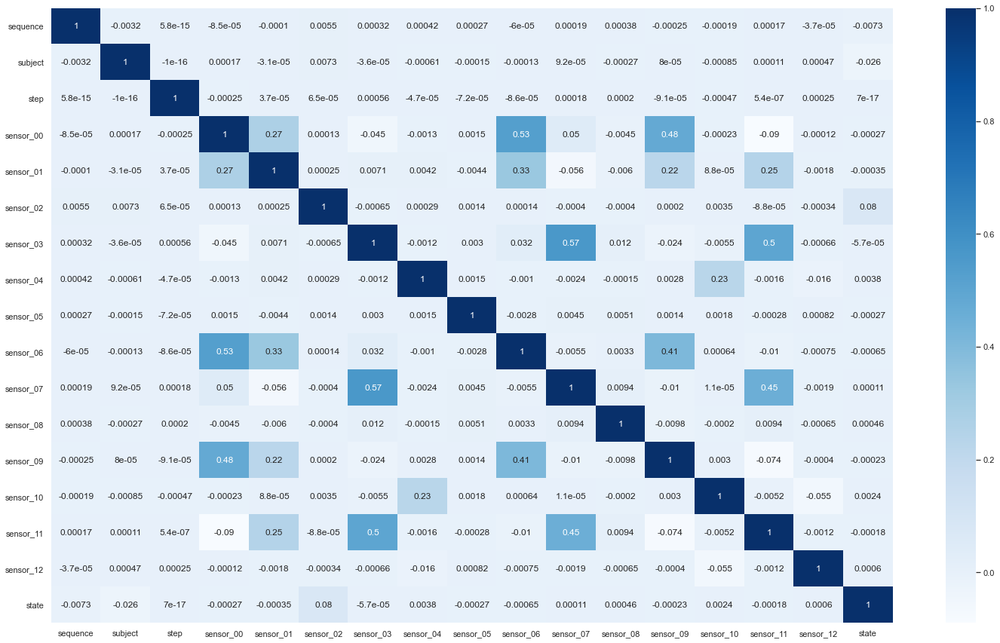

In [18]:
plt.figure(figsize=(25,15))

sns.heatmap(train_df.corr(),cbar=True,annot=True,cmap='Blues')

/Users/khaledjdeed/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='state', ylabel='count'>

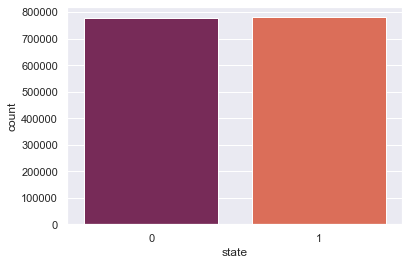

In [7]:
sns.countplot(train_df['state'], palette = 'rocket')
#As we can see below the dataset is balanced for being aa classificstion problem 

In [3]:
# get the name of all sensor columns
sensor_columns = [col for col in train_df.columns
                  if 'sensor' in col.split('_')]

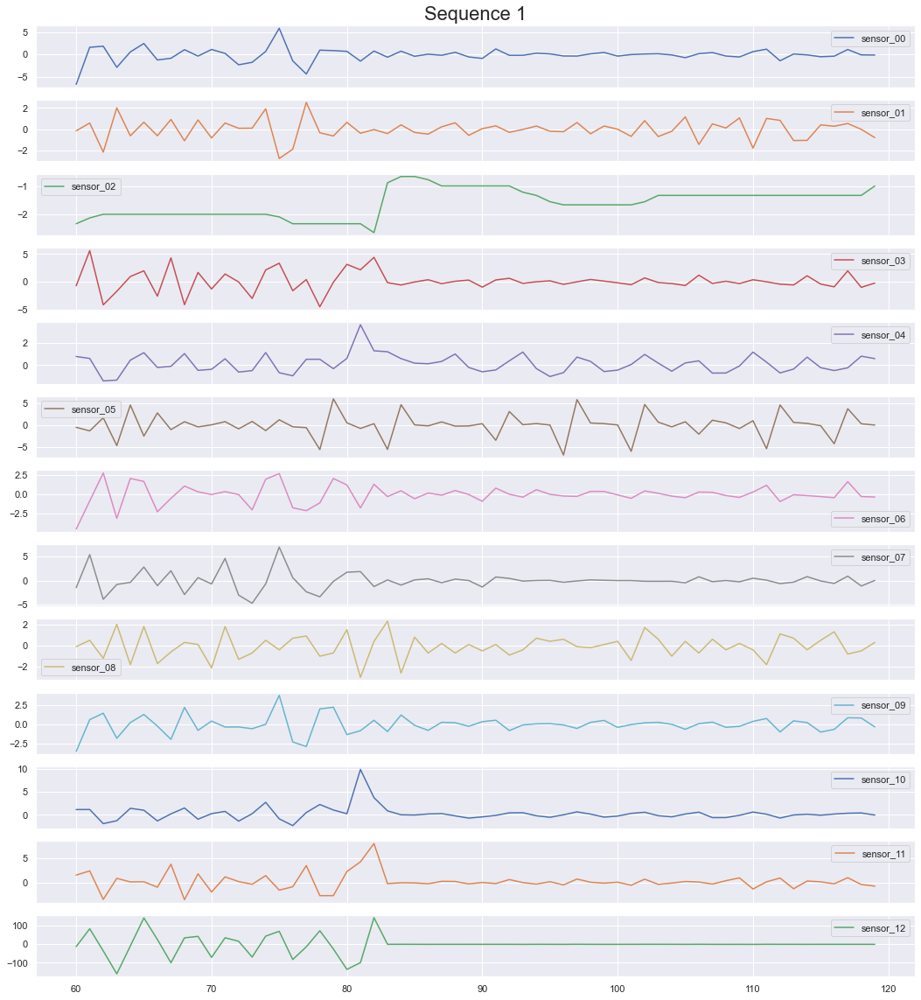

In [4]:
def plot_sequence(sequence: int) -> None:
    mask = train_df.sequence == sequence
    ax = train_df[mask][sensor_columns].plot(subplots=True,
                                             sharex=True,
                                             figsize=(18, 20))
    ax[0].set_title(f'Sequence {sequence}', size=22)
    plt.show()

plot_sequence(1)

<ipython-input-83-36273417418c>:12: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show();


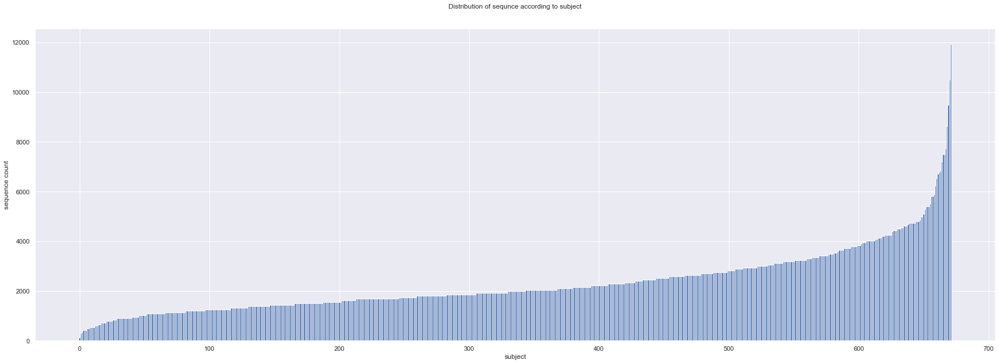

In [83]:
fig, axes = plt.subplots(4, 5, figsize=(30, 10))
ax = plt.subplot(1,1,1)
temp = train_df.subject.value_counts().sort_values() 

ax.bar(range(len(temp)), temp, width=1, color="b");
for s in ["top","right"]:
    ax.spines[s].set_visible(False)
    
plt.xlabel('subject');
plt.ylabel('sequence count');
plt.title('Distribution of sequnce according to subject', y=1.055);
plt.show();


/Users/khaledjdeed/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/khaledjdeed/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
<ipython-input-90-18ed2b37adc5>:6: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


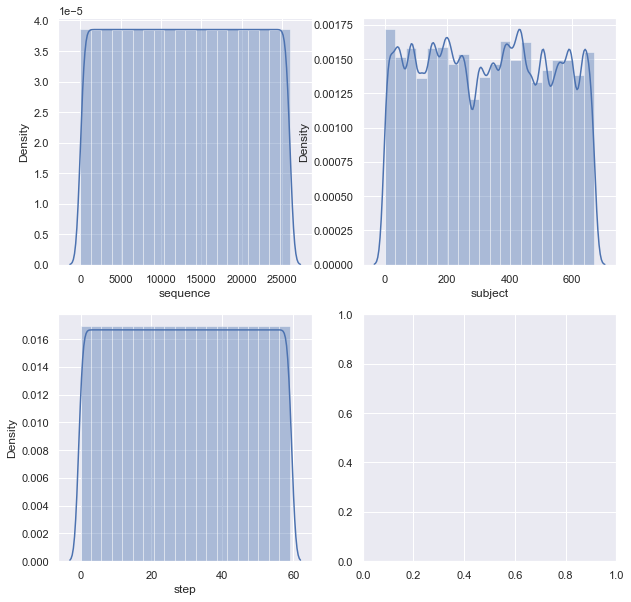

In [90]:
fig, ax = plt.subplots(2,2, figsize=(10,10))

sns.distplot(train_df.sequence, bins=20, ax=ax[0,0])
sns.distplot(train_df.subject, bins=20, ax=ax[0,1])
sns.distplot(train_df.step, bins = 20, ax=ax[1,0]) 
plt.show()

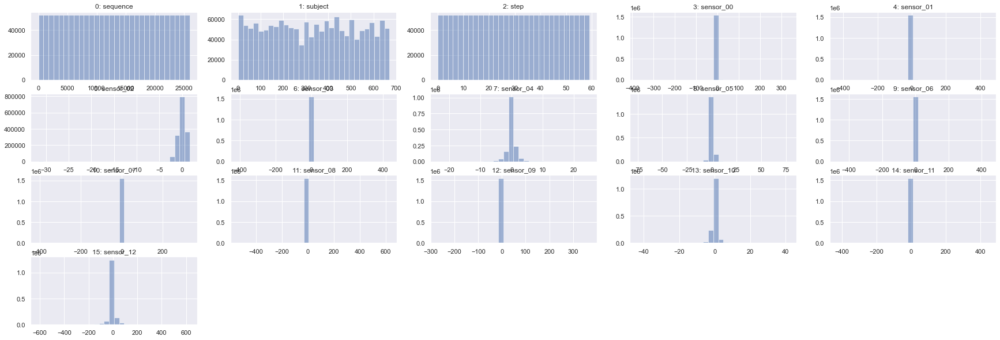

In [13]:
fig, axes = plt.subplots(4, 5, figsize=(30, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 15:
        ax.set_visible(False) 
        continue
    ax.hist(train_df.values[:, i], bins=30
            , alpha=0.5)
    ax.set_title("{}: {}".format(i, train_df.columns[i]))

#we can observse from th efollowing plot that there may be some outliers
#should delt with in feature enngineering

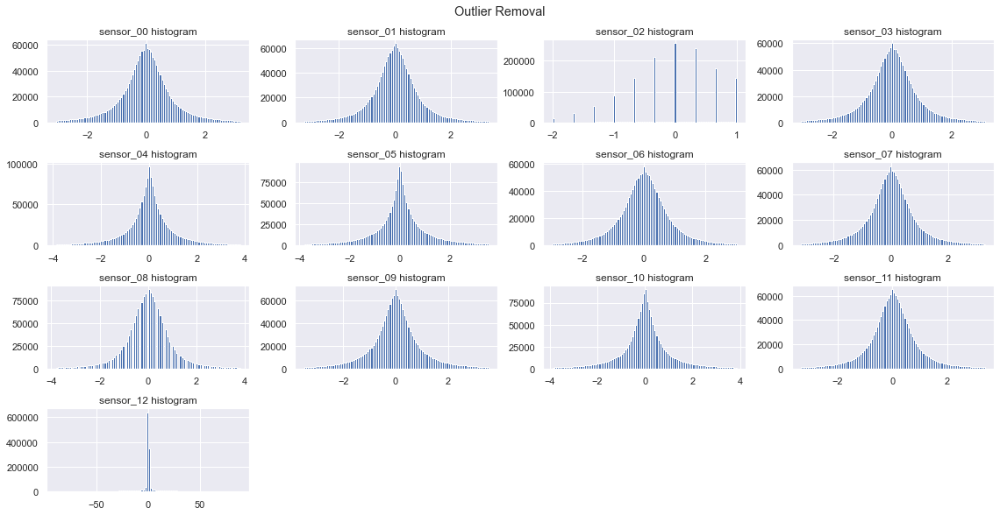

In [7]:
figure = plt.figure(figsize=(16, 8))
for sensor in range(13):
    sensor_name = f"sensor_{sensor:02d}"
    plt.subplot(4, 4, sensor+1)
    plt.hist(train_df[sensor_name], bins=100,
             range=(train_df[sensor_name].quantile(0.02),
                    train_df[sensor_name].quantile(0.98)))
    plt.title(f"{sensor_name} histogram")
figure.tight_layout(h_pad=1.0, w_pad=0.5)
plt.suptitle('Outlier Removal', y=1.02)
plt.show()


# 2) Feature Engineering

For the feature engineering, we will be using only the mean, standard deviation, maximum, and minimum of all the sensor in order to make prediction.

In [6]:
def create_features_df(df: pd.DataFrame, agg_dict) -> pd.DataFrame:
    feature_df = df.groupby('sequence').agg(agg_dict)
    feature_df.columns = ["_".join(x) for x in feature_df.columns]
    return feature_df.reset_index()

In [7]:
def q50(x):
    return x.quantile(0.2)

def q90(x):
    return x.quantile(0.9)

dict_features = {
    col: ['mean', 'std', 'max', 'min', 'skew', 'median', q50, q90]
    for col in sensor_columns
}

feature_df = create_features_df(train_df, dict_features)
feature_df.head()

test_features = create_features_df(test_df, dict_features)
test_sequence = test_features['sequence']
test_features = test_features.drop('sequence', axis=1)
test_features.head()

,sensor_00_mean,sensor_00_std,sensor_00_max,sensor_00_min,sensor_00_skew,sensor_00_median,sensor_00_q50,sensor_00_q90,sensor_01_mean,sensor_01_std,...,sensor_11_q50,sensor_11_q90,sensor_12_mean,sensor_12_std,sensor_12_max,sensor_12_min,sensor_12_skew,sensor_12_median,sensor_12_q50,sensor_12_q90
0,-0.002602,1.091741,3.146832,-4.950541,-0.927921,-0.002318,-0.002318,1.005255,-0.036432,4.499484,...,0.121399,1.741975,-0.000945,0.369897,0.716539,-0.809889,-0.145905,-0.008951,-0.008951,0.460614
1,0.028516,1.450040,5.816074,-3.675425,1.644888,-0.015842,-0.015842,1.065765,0.002276,0.775379,...,-0.028292,1.023251,0.024290,0.659728,1.224638,-1.237852,-0.075055,-0.021526,-0.021526,0.876854
2,0.057664,5.083618,12.306028,-15.005410,-0.634247,1.079212,1.079212,5.042658,-0.021796,2.903657,...,0.217593,3.024383,0.071284,19.027800,36.157289,-36.565644,0.205394,-5.026854,-5.026854,26.597272
3,-0.004791,0.914917,2.876352,-2.465997,0.218435,-0.033617,-0.033617,1.037403,0.014863,0.950923,...,-0.099280,0.719650,0.021114,0.889882,1.488917,-2.574595,-0.181651,-0.036871,-0.036871,1.164024
4,-0.001443,2.783685,17.295209,-9.974498,3.383219,-0.171947,-0.171947,0.717852,-0.025350,23.942241,...,-0.057099,1.312140,12.399581,153.174703,323.667093,-328.497869,-0.313355,21.420716,21.420716,186.857289


In [8]:
feature_df = pd.merge(left=feature_df, right=label_df, how='left')
feature_df = feature_df.drop('sequence', axis=1)
feature_df.head()

,sensor_00_mean,sensor_00_std,sensor_00_max,sensor_00_min,sensor_00_skew,sensor_00_median,sensor_00_q50,sensor_00_q90,sensor_01_mean,sensor_01_std,...,sensor_11_q90,sensor_12_mean,sensor_12_std,sensor_12_max,sensor_12_min,sensor_12_skew,sensor_12_median,sensor_12_q50,sensor_12_q90,state
0,0.041744,1.431660,7.534003,-5.634467,1.488052,-0.148764,-0.148764,0.989490,-0.013025,1.509221,...,1.360700,-1.286985,8.206880,6.674766,-50.658994,-4.235184,-0.447997,-0.447997,4.865303,0
1,-0.069294,1.593907,5.870943,-6.657651,-0.683454,-0.031298,-0.031298,1.145518,-0.019958,0.949403,...,1.833333,-1.604085,50.291288,144.598039,-160.234442,-0.222063,-0.009591,-0.009591,43.229454,1
2,-0.001546,1.147526,3.402628,-2.797527,0.122688,0.058733,0.058733,1.354096,0.025000,0.803884,...,0.638786,0.000945,0.361055,1.116795,-1.044331,0.076284,-0.004902,-0.004902,0.372634,1
3,0.029869,1.769705,4.856260,-3.643740,0.306005,-0.119784,-0.119784,2.267697,-0.049177,1.914868,...,1.610905,-0.003708,0.241708,0.593350,-0.837170,-0.185013,-0.012361,-0.012361,0.282779,1
4,0.059132,2.014779,5.455951,-5.331530,-0.216130,0.005410,0.005410,2.548223,0.014916,1.385251,...,3.932819,0.000028,0.051600,0.135976,-0.098465,0.394610,0.002344,0.002344,0.051876,1


# defining inputs and output as X and y respectively

In [8]:
from sklearn.model_selection import train_test_split

y = features_df['state']
X = features_df.drop('state', axis=1)


# splitting the dataset into testing and training

In [9]:
#splitting the dataset into testing and training with test siz of 30 percent
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    stratify=y,
                                                    random_state=42)

# SelectKBest Feature Selection:

# Selecting top 60 features using  SelectKBest Feature Selection 

In [10]:
# Feature Selection with Univariate Statistical Tests
from pandas import read_csv
from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

# feature extraction
test = SelectKBest(score_func=f_classif, k=60)
fit = test.fit(X, y)
X_train = fit.transform(X_train)
X_test = fit.transform(X_test)
test_features = fit.transform(test_features)

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

# Modeling

# Model 1: Decision Tree classifier

# Grid search for hyperparameter optimization

In [12]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
param_grid = {'max_features': ['auto', 'sqrt', 'log2',None],
              'ccp_alpha': [0.1, .01, .001,0.0],
              'max_depth' : [None, 6, 7, 8, 9,50,100],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=1024)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 224 candidates, totalling 1120 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1024),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001, 0.0],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 6, 7, 8, 9, 50, 100],
                         'max_features': ['auto', 'sqrt', 'log2', None]},
             verbose=True)

In [13]:
print(grid_search.best_params_)

{'ccp_alpha': 0.0, 'criterion': 'gini', 'max_depth': 9, 'max_features': None}


In [14]:
final_model = grid_search.best_estimator_
final_model

DecisionTreeClassifier(max_depth=9, random_state=1024)

# Observation:
{'ccp_alpha': 0.0, 'criterion': 'gini', 'max_depth': 9, 'max_features': None} are the best parameters for decision tree classifier

# Training and evaluating decision tree classifier after hyperparameter tuning

<AxesSubplot:>

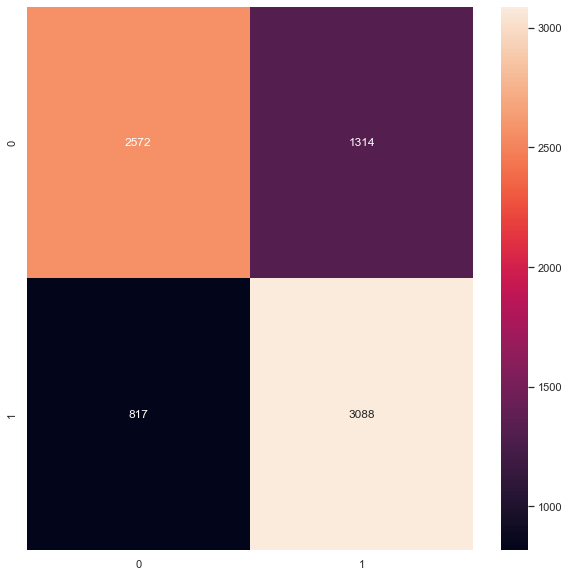

In [15]:
from sklearn.metrics import confusion_matrix

dt =DecisionTreeClassifier(ccp_alpha= 0.001, criterion='entropy', max_depth= 9, max_features= None,random_state=10000)
dt.fit(X_train, y_train)
y_predict_dt = dt.predict(X_test)
# confusion_matrix
plt.figure(figsize=(10,10))
cm = confusion_matrix(y_test, y_predict_dt)
sns.heatmap(cm, annot=True, fmt="d")


In [16]:
print('accuracy',accuracy_score((y_test), y_predict_dt))
print('precision',precision_score(y_test, y_predict_dt))
print('recall',recall_score(y_test, y_predict_dt))

accuracy 0.7264792709536645
precision 0.7014993184915947
recall 0.7907810499359795


# Observation:
We calculate the Accuracy, precision, and recall of the Decision Tree Classifier which is .72, .70, and .79 respectively

# Model 2:KNN classifier

# Grid search for hyperparameter optimization

In [17]:
from sklearn.neighbors import KNeighborsClassifier
import warnings
warnings.filterwarnings('ignore')

params = {'n_neighbors':range(1,20),"metric":["euclidean", "manhattan"],
              'algorithm' :['ball_tree','kd_tree','brute']
        
             }
knn=KNeighborsClassifier()
gs = GridSearchCV(knn, param_grid= params, cv = 5,scoring = "roc_auc",verbose=1)
gs.fit(X_train, y_train)
print(gs.best_score_)
print(gs.best_estimator_)
print(gs.best_params_)

Fitting 5 folds for each of 114 candidates, totalling 570 fits
0.8006334235787861
KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=19)
{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 19}


# Observation:
{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 19} are the best parameters for KNeighborsClassifier

# Training and evaluating KNeighborsClassifier after hyperparameter tuning

<AxesSubplot:>

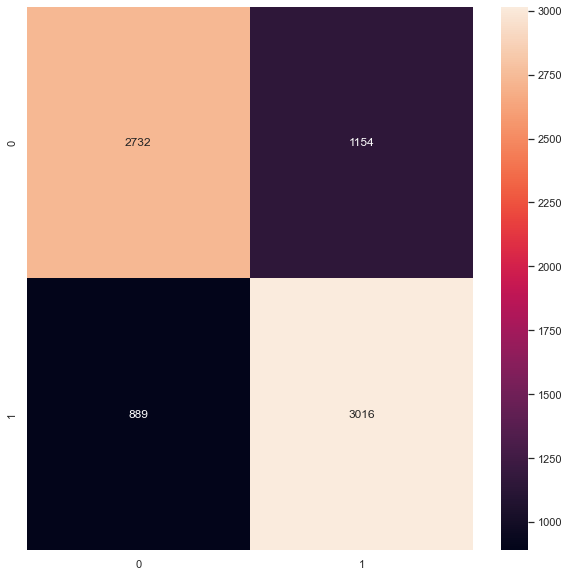

In [18]:
knn = KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=15)
knn.fit(X_train, y_train)
y_predict_knn = knn.predict(X_test)
# confusion_matrix
plt.figure(figsize=(10,10))
cm = confusion_matrix(y_test, y_predict_knn)
sns.heatmap(cm, annot=True, fmt="d")

In [19]:
print('accuracy',accuracy_score((y_test), y_predict_knn))
print('precision',precision_score(y_test, y_predict_knn))
print('recall',recall_score(y_test, y_predict_knn))

accuracy 0.7377743550250289
precision 0.7232613908872901
recall 0.7723431498079385


# Observation:
We calculate the Accuracy, precision, and recall of the KNeighborsClassifier which is .73, .72, and .77 respectively.

# Model 3:RandomForestClassifier

# Grid search for hyperparameter optimization

In [20]:
from sklearn.ensemble import RandomForestClassifier

# Creating the model:
rf = RandomForestClassifier(random_state=1000) 
params = { 
    'n_estimators': [100,200,500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [5,10,20,50,None],
    'criterion' :['gini', 'entropy']
}

gs = GridSearchCV(rf, param_grid= params, cv = 5,scoring = "roc_auc",verbose=1)
gs.fit(X_train, y_train)
print(gs.best_score_)
print(gs.best_estimator_)
print(gs.best_params_)

Fitting 5 folds for each of 90 candidates, totalling 450 fits
0.8735044621382331
RandomForestClassifier(criterion='entropy', max_depth=50, max_features='log2',
                       n_estimators=500, random_state=1000)
{'criterion': 'entropy', 'max_depth': 50, 'max_features': 'log2', 'n_estimators': 500}


# Observation:
{'criterion': 'entropy', 'max_depth': 50, 'max_features': 'log2', 'n_estimators': 500}are the best parameters for RandomForestClassifier

# Training and evaluating RandomForestClassifier after hyperparameter tuning

<AxesSubplot:>

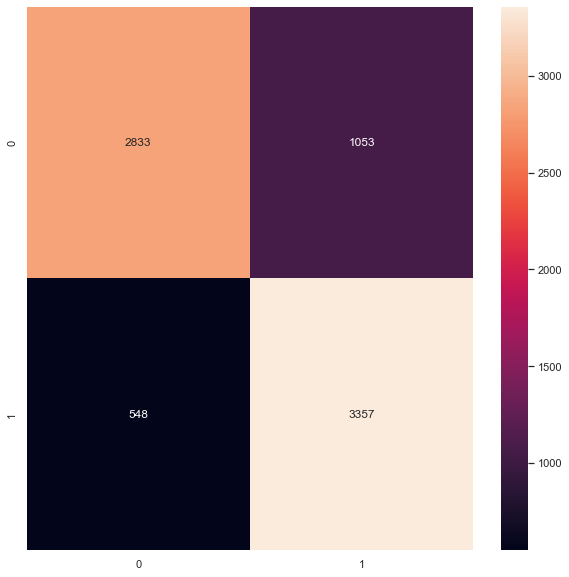

In [24]:
rf =RandomForestClassifier(criterion= 'entropy', max_depth= 50, max_features= 'log2', n_estimators= 500,random_state=1000) 
rf.fit(X_train, y_train)
y_predict_rf = rf.predict(X_test)
# confusion_matrix
plt.figure(figsize=(10,10))
cm = confusion_matrix(y_test, y_predict_rf)
sns.heatmap(cm, annot=True, fmt="d")

In [25]:
print('accuracy',accuracy_score((y_test), y_predict_rf))
print('precision',precision_score(y_test, y_predict_rf))
print('recall',recall_score(y_test, y_predict_rf))

accuracy 0.7945064818380182
precision 0.7612244897959184
recall 0.8596670934699103


# Observation:
We calculate the Accuracy, precision, and recall of the RandomForestClassifier which is .79, .76, and .85 respectively.

# Predictions on submission data:
    As we have concluded  from the above evaluations that random forest is giving maximum accuracy from rest of the models, So I will use Random Forest calssifier for the predictions on submission data

In [31]:
#read sunmission csv
submission=pd.read_csv('sample_submission.csv')
submission

,sequence,state
0,25968,0
1,25969,0
2,25970,0
3,25971,0
4,25972,0
...,...,...
12213,38181,0
12214,38182,0
12215,38183,0
12216,38184,0


In [33]:
#  saving predicsions predictions of test features on submission data
submission['state']=rf.predict(test_features)
submission

,sequence,state
0,25968,1
1,25969,1
2,25970,0
3,25971,0
4,25972,1
...,...,...
12213,38181,1
12214,38182,1
12215,38183,1
12216,38184,0


In [35]:
submission['state'].value_counts()

1    6803
0    5415
Name: state, dtype: int64

In [36]:
# Function to create barplots that indicate percentage for each category.
def perc_on_bar(plot, feature):
    '''
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    '''

    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # height of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percentage 
        
    plt.show()

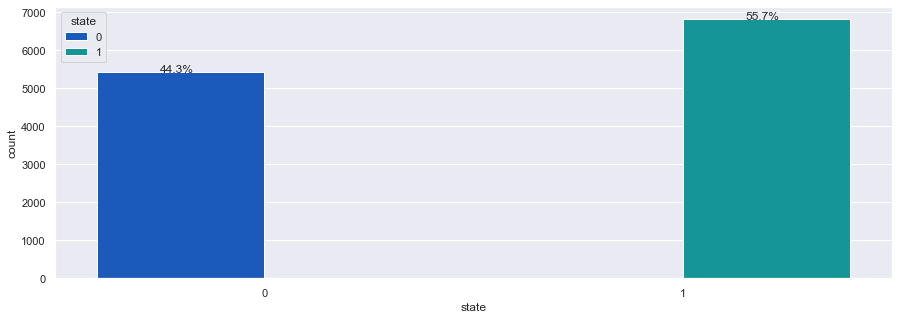

In [38]:
#Build barplot for state
plt.figure(figsize=(15,5))
ax = sns.countplot(submission["state"],palette='winter',hue=submission['state'])
perc_on_bar(ax,submission["state"])

In [39]:
#saving the submission file in csv format
submission.to_csv('sample_submission.csv')